Bennett Bush

2024-04-17

CS-312

Machine Learning and AI

This project is an exploration on how a neural network can make decisions through genetics, based on the environment and position of their adversary. Game theory is a concept originating in economics, and later translated into mathematic theory. The overarching concept is to boil different interactions between agents down to their core concepts. There are many forms of "games" within game theory, from simple games like tic-tac-toe to complex games like poker, chess, and Go. The focus of this project is to observe how a machine learning model can learn how to play a simple game theory game through an evolutions, just like a natural organism could. Given the problem, the best fitting game format is the dove-hawk game, which simulates a predator-prey relationship. This game is simple, similar to the game of chicken.  The two players compete for points, where the goal is to score as many as possible within the matchup between two agents. At the beginning of every round, a random number of points are available. If both agents choose dove -- or to cooperate -- they split the points evenly. If one chooses hawk and the other dove, hawk wins and takes all points. However, if both players choose hawk, then they split points evenly with a preset penalty for both choosing non-cooperation. This game format provides a simple, but robust way to demonstrate how even a simple neural network can learn the core concepts of cooperation, agent interatctions, and predictive strategies from genetic algorithms.



A large dataset of simulated dove-hawk games can be generated by creating a handful of strategies, along with randomized ones. From there, an initial population of neural networks can be initiated and tested for performance on the dataset, where all created NNs have the same architecture, with randomized weights for random performance. The top performing agents are then able to repopulate the next generation, and pass on their genetic info. In this scenario, the genes passed on are vectors of the actual weights and biases of the NNs. This allows for genetic patterns to emerge as time progresses, as well as change in the events of genetic mutations. This process is all done through the open source python library PyGAD.

In [ ]:
!pip3 install pygad
import numpy as np
import pandas as pd
import pygad
import pygad.gann
import pygad.nn
import tensorflow
import random
import keras
from sklearn.preprocessing import OneHotEncoder

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 2.4 MB/s eta 0:00:00


generate simple strategies for building the dataset

In [ ]:
def alwaysDove (roundNum, selfMoves, selfOpponentMoves, selfTotalScore, oppMoves, oppOpponentMoves, oppTotalScore, fullPoints, nextRoundPoints, self): # always chooses dove
  alwaysDoveOutput = 0
  return alwaysDoveOutput

def alwaysHawk (roundNum, selfMoves, selfOpponentMoves, selfTotalScore, oppMoves, oppOpponentMoves, oppTotalScore, fullPoints, nextRoundPoints, self): # always chooses hawk
  alwaysHawkOutput = 1
  return alwaysHawkOutput

def tenDove (roundNum, selfMoves, selfOpponentMoves, selfTotalScore, oppMoves, oppOpponentMoves, oppTotalScore, fullPoints, nextRoundPoints, self): # 10% chance of choosing dove
  rand = np.random.randint(0,11)
  if rand <= 1:
    randomStratOutput = 0
  else:
    randomStratOutput = 1
  return randomStratOutput

def twentyDove (roundNum, selfMoves, selfOpponentMoves, selfTotalScore, oppMoves, oppOpponentMoves, oppTotalScore, fullPoints, nextRoundPoints, self): # 20%
  rand = np.random.randint(0,11)
  if rand <= 2:
    randomStratOutput = 0
  else:
    randomStratOutput = 1
  return randomStratOutput

def thirtyDove (roundNum, selfMoves, selfOpponentMoves, selfTotalScore, oppMoves, oppOpponentMoves, oppTotalScore, fullPoints, nextRoundPoints, self):
  rand = np.random.randint(0,11)
  if rand <= 3:
    randomStratOutput = 0
  else:
    randomStratOutput = 1
  return randomStratOutput

def fortyDove (roundNum, selfMoves, selfOpponentMoves, selfTotalScore, oppMoves, oppOpponentMoves, oppTotalScore, fullPoints, nextRoundPoints, self):
  rand = np.random.randint(0,11)
  if rand <= 4:
    randomStratOutput = 0
  else:
    randomStratOutput = 1
  return randomStratOutput

def fiftyDove (roundNum, selfMoves, selfOpponentMoves, selfTotalScore, oppMoves, oppOpponentMoves, oppTotalScore, fullPoints, nextRoundPoints, self):
  rand = np.random.randint(0,11)
  if rand <= 5:
    randomStratOutput = 0
  else:
    randomStratOutput = 1
  return randomStratOutput

def sixtyDove (roundNum, selfMoves, selfOpponentMoves, selfTotalScore, oppMoves, oppOpponentMoves, oppTotalScore, fullPoints, nextRoundPoints, self):
  rand = np.random.randint(0,11)
  if rand <= 6:
    randomStratOutput = 0
  else:
    randomStratOutput = 1
  return randomStratOutput

def seventyDove (roundNum, selfMoves, selfOpponentMoves, selfTotalScore, oppMoves, oppOpponentMoves, oppTotalScore, fullPoints, nextRoundPoints, self):
  rand = np.random.randint(0,11)
  if rand <= 7:
    randomStratOutput = 0
  else:
    randomStratOutput = 1
  return randomStratOutput

def eightyDove (roundNum, selfMoves, selfOpponentMoves, selfTotalScore, oppMoves, oppOpponentMoves, oppTotalScore, fullPoints, nextRoundPoints, self):
  rand = np.random.randint(0,11)
  if rand <= 8:
    randomStratOutput = 0
  else:
    randomStratOutput = 1
  return randomStratOutput

def ninetyDove (roundNum, selfMoves, selfOpponentMoves, selfTotalScore, oppMoves, oppOpponentMoves, oppTotalScore, fullPoints, nextRoundPoints, self):
  rand = np.random.randint(0,11)
  if rand <= 9:
    randomStratOutput = 0
  else:
    randomStratOutput = 1
  return randomStratOutput

def titForTatDove (roundNum, selfMoves, selfOpponentMoves, selfTotalScore, oppMoves, oppOpponentMoves, oppTotalScore, fullPoints, nextRoundPoints, self): # starts with dove, and repeats opponent's previous move
  if self == 0:
    opponentMoves = selfOpponentMoves
  else:
    opponentMoves = oppOpponentMoves

  if roundNum == 1:
    titForTatOutput = 0
  elif opponentMoves[-1] == 0:
    titForTatOutput = 0
  elif opponentMoves[-1] == 1:
    titForTatOutput = 1
  return titForTatOutput

def titForTatHawk (roundNum, selfMoves, selfOpponentMoves, selfTotalScore, oppMoves, oppOpponentMoves, oppTotalScore, fullPoints, nextRoundPoints, self): # starts wih hawk
  if self == 0:
    opponentMoves = selfOpponentMoves
  else:
    opponentMoves = oppOpponentMoves

  if roundNum == 1:
    titForTatOutput = 1
  elif opponentMoves[-1] == 0:
    titForTatOutput = 0
  elif opponentMoves[-1] == 1:
    titForTatOutput = 1
  return titForTatOutput

def twoStrikes (roundNum, selfMoves, selfOpponentMoves, selfTotalScore, oppMoves, oppOpponentMoves, oppTotalScore, fullPoints, nextRoundPoints, self): # if opponent chooses hawk twice, self starts using hawk
  if self == 0:
    opponentMoves = selfOpponentMoves
  else:
    opponentMoves = oppOpponentMoves

  OpPrev2 = opponentMoves[-2:]
  if sum(OpPrev2) < 2:
    twoStrikesOutput = 0
  else:
    twoStrikesOutput = 1
  return twoStrikesOutput

def threeStrikes (roundNum, selfMoves, selfOpponentMoves, selfTotalScore, oppMoves, oppOpponentMoves, oppTotalScore, fullPoints, nextRoundPoints, self): # if opponent chooses hawk thrice, self starts using hawk
  if self == 0:
    opponentMoves = selfOpponentMoves
  else:
    opponentMoves = oppOpponentMoves

  OpPrev3 = opponentMoves[-3:]
  if sum(OpPrev3) < 3:
    threeStrikesOutput = 0
  else:
    threeStrikesOutput = 1
  return threeStrikesOutput

def greedy (roundNum, selfMoves, selfOpponentMoves, selfTotalScore, oppMoves, oppOpponentMoves, oppTotalScore, fullPoints, nextRoundPoints, self): # chooses hawk on big points
  if nextRoundPoints == 99999:
    if fullPoints >= 5:
      greedyOutput = 1
    else:
      greedyOutput = 0
  elif nextRoundPoints != 99999:
    if nextRoundPoints >= 5:
      greedyOutput = 1
    else:
      greedyOutput = 0
  return greedyOutput

def giving (roundNum, selfMoves, selfOpponentMoves, selfTotalScore, oppMoves, oppOpponentMoves, oppTotalScore, fullPoints, nextRoundPoints, self): # chooses dove on big points
  if nextRoundPoints == 99999:
    if fullPoints >= 5:
      givingOutput = 0
    else:
      givingOutput = 1
  elif nextRoundPoints != 99999:
    if fullPoints >= 5:
      givingOutput = 0
    else:
      givingOutput = 1
  return givingOutput

def noTolerance (roundNum, selfMoves, selfOpponentMoves, selfTotalScore, oppMoves, oppOpponentMoves, oppTotalScore, fullPoints, nextRoundPoints, self): # chooses dove unil opponent chooses hawk
  sumOpp = sum(oppMoves)
  if sumOpp == 0:
    noToleranceOutput = 0
  else:
    noToleranceOutput = 1
  return noToleranceOutput

def someTolerance (roundNum, selfMoves, selfOpponentMoves, selfTotalScore, oppMoves, oppOpponentMoves, oppTotalScore, fullPoints, nextRoundPoints, self): # chooses dove unil opponent chooses hawk twice
  sumOpp = sum(oppMoves)
  if sumOpp > 1:
    someToleranceOutput = 1
  else:
    someToleranceOutput = 0
  return someToleranceOutput

def tatForTitHawk (roundNum, selfMoves, selfOpponentMoves, selfTotalScore, oppMoves, oppOpponentMoves, oppTotalScore, fullPoints, nextRoundPoints, self): # inverse of tit for tat hawk
  if self == 0:
    opponentMoves = selfOpponentMoves
  else:
    opponentMoves = oppOpponentMoves

  if roundNum == 1:
    titForTatOutput = 1
  elif opponentMoves[-1] == 1:
    titForTatOutput = 0
  elif opponentMoves[-1] == 0:
    titForTatOutput = 1
  return titForTatOutput

def tatForTitDove (roundNum, selfMoves, selfOpponentMoves, selfTotalScore, oppMoves, oppOpponentMoves, oppTotalScore, fullPoints, nextRoundPoints, self):  # inverse of tit for tat dove
  if self == 0:
    opponentMoves = selfOpponentMoves
  else:
    opponentMoves = oppOpponentMoves

  if roundNum == 1:
    titForTatOutput = 0
  elif opponentMoves[-1] == 1:
    titForTatOutput = 0
  elif opponentMoves[-1] == 0:
    titForTatOutput = 1
  return titForTatOutput





building the dataset; this process involves many steps and calculations to mass produce custom game thoery simulations

In [ ]:
stratList = [alwaysDove, alwaysHawk, tenDove, twentyDove, thirtyDove, fortyDove, fiftyDove, sixtyDove, seventyDove, eightyDove, ninetyDove, titForTatDove, titForTatHawk, twoStrikes, threeStrikes, greedy, giving, noTolerance, someTolerance, tatForTitHawk, tatForTitDove]

def matchup ():

#choose points
  randRounds = np.random.randint(1, 11)

#choose strategies
  selfStratNum = np.random.randint(len(stratList))
  oppStratNum = np.random.randint(len(stratList))

  selfStrat = stratList[selfStratNum]
  oppStrat = stratList[oppStratNum]

#setting base counters
  selfTotalScore = 0
  oppTotalScore = 0

  totalPoints = 0
  roundNum = 1

  selfMoves = [] # start with empty lists
  oppMoves = []

  nextRoundPoints = 99999 # just a placeholder

  for i in range(randRounds):

    selfScore = 0
    oppScore = 0

# set points values
    fullPoints = np.random.randint(1, 11)
    dovesPoints = fullPoints/2
    hawksPoints = dovesPoints - 1

    selfOpponentMoves = oppMoves
    oppOpponentMoves = selfMoves

    #scoring
    selfChoice = selfStrat(roundNum, selfMoves, selfOpponentMoves, selfTotalScore, oppMoves, oppOpponentMoves, oppTotalScore, fullPoints, nextRoundPoints, 0)
    oppChoice = oppStrat(roundNum, selfMoves, selfOpponentMoves, selfTotalScore, oppMoves, oppOpponentMoves, oppTotalScore, fullPoints, nextRoundPoints, 1)
    if selfChoice == 0:
      if oppChoice == 0:
        selfScore += dovesPoints
        oppScore += dovesPoints
      elif oppChoice == 1:
        selfScore += 0
        oppScore += fullPoints
    elif selfChoice == 1:
      if oppChoice == 0:
        selfScore += fullPoints
        oppScore += 0
      elif oppChoice == 1:
        selfScore += hawksPoints
        oppScore += hawksPoints

    #updating information
    selfTotalScore = selfTotalScore + selfScore
    oppTotalScore = oppTotalScore + oppScore
    totalPoints = totalPoints + fullPoints
    roundNum += 1
    selfMoves.append(selfChoice)
    oppMoves.append(oppChoice)





  nextRoundPoints = np.random.randint(1, 11)
  nextDovesPoints = nextRoundPoints/2
  nextHawksPoints = nextDovesPoints - 1

  selfNextScore = 0
  oppNextScore = 0

  selfNextMove = np.random.randint(0, 2)
  oppNextMove = oppStrat(roundNum, selfMoves, selfOpponentMoves, selfTotalScore, oppMoves, oppOpponentMoves, oppTotalScore, fullPoints, nextRoundPoints, 1)

# score the next moves of the players (for training individual networks)
  if selfNextMove == 0:
    if oppNextMove == 0:
       selfNextScore += nextDovesPoints
       oppNextScore += nextDovesPoints
    elif oppNextMove == 1:
       selfNextScore += 0
       oppNextScore += nextRoundPoints
  elif selfNextMove == 1:
     if oppNextMove == 0:
       selfNextScore += nextRoundPoints
       oppNextScore += 0
     elif oppNextMove == 1:
       selfNextScore += nextHawksPoints
       oppNextScore += nextHawksPoints

  finalTotalPoints = totalPoints + nextRoundPoints





  selfFinalScore = selfNextScore + selfTotalScore
  oppFinalScore = oppNextScore + oppTotalScore



  selfMoves = [num + 1 for num in selfMoves]
  oppMoves = [num + 1 for num in oppMoves]

  numZeros = 10 - randRounds
  zerosList = [0] * numZeros

  selfMoves = selfMoves + zerosList
  oppMoves =  oppMoves + zerosList



  # one-hot-encoding the selfMoves and oppMoves
  selfRoundone = selfMoves[0]
  selfRoundtwo = selfMoves[1]
  selfRoundthree = selfMoves[2]
  selfRoundfour = selfMoves[3]
  selfRoundfive = selfMoves[4]
  selfRoundsix = selfMoves[5]
  selfRoundseven = selfMoves[6]
  selfRoundeight = selfMoves[7]
  selfRoundnine = selfMoves[8]
  selfRoundten = selfMoves[9]

  oppRoundone = oppMoves[0]
  oppRoundtwo = oppMoves[1]
  oppRoundthree = oppMoves[2]
  oppRoundfour = oppMoves[3]
  oppRoundfive = oppMoves[4]
  oppRoundsix = oppMoves[5]
  oppRoundseven = oppMoves[6]
  oppRoundeight = oppMoves[7]
  oppRoundnine = oppMoves[8]
  oppRoundten = oppMoves[9]

  outputScore = selfNextScore/nextRoundPoints # just looks at how much the model gained or lost after it's final decision




  toDF = [randRounds,
          selfRoundone, selfRoundtwo, selfRoundthree, selfRoundfour, selfRoundfive, selfRoundsix, selfRoundseven, selfRoundeight, selfRoundnine, selfRoundten,
          oppRoundone, oppRoundtwo, oppRoundthree, oppRoundfour, oppRoundfive, oppRoundsix, oppRoundseven, oppRoundeight, oppRoundnine, oppRoundten, selfTotalScore, oppTotalScore,
          totalPoints, nextRoundPoints, selfNextMove, oppNextMove, selfNextScore, oppNextScore, outputScore]
  return (toDF)

#print(matchup(np.random.randint(1, 11)))

def dataSize(numMatchups):
    rows = []

    for i in range(numMatchups):
        newRow = matchup()
        rows.append(newRow)

    df = pd.DataFrame(rows, columns=['randRounds',
          'selfRoundone', 'selfRoundtwo', 'selfRoundthree', 'selfRoundfour', 'selfRoundfive', 'selfRoundsix', 'selfRoundseven', 'selfRoundeight', 'selfRoundnine', 'selfRoundten',
          'oppRoundone', 'oppRoundtwo', 'oppRoundthree', 'oppRoundfour', 'oppRoundfive', 'oppRoundsix', 'oppRoundseven', 'oppRoundeight', 'oppRoundnine', 'oppRoundten', 'selfTotalScore', 'oppTotalScore',
          'totalPoints', 'nextRoundPoints', 'selfNextMove', 'oppNextMove', 'selfNextScore', 'oppNextScore', 'outputScore'])

    return df
trainData = dataSize(100000)
trainData[:10]

# #trainData.to_csv('/home/trainData.csv', index=False)

,randRounds,selfRoundone,selfRoundtwo,selfRoundthree,selfRoundfour,selfRoundfive,selfRoundsix,selfRoundseven,selfRoundeight,selfRoundnine,...,oppRoundten,selfTotalScore,oppTotalScore,totalPoints,nextRoundPoints,selfNextMove,oppNextMove,selfNextScore,oppNextScore,outputScore
0,10,1,1,2,1,1,2,1,1,1,...,1,23.0,31.0,54,6,1,0,6.0,0.0,1.000000
1,2,2,2,0,0,0,0,0,0,0,...,0,10.0,0.0,10,7,1,0,7.0,0.0,1.000000
2,2,2,2,0,0,0,0,0,0,0,...,0,20.0,0.0,20,7,0,0,3.5,3.5,0.500000
3,5,1,1,1,2,2,0,0,0,0,...,0,10.0,12.0,24,2,1,0,2.0,0.0,1.000000
4,5,1,2,2,2,2,0,0,0,0,...,0,12.0,15.0,35,5,0,1,0.0,5.0,0.000000
5,4,1,2,1,1,0,0,0,0,0,...,0,3.5,16.5,22,2,1,0,2.0,0.0,1.000000
6,10,1,1,1,1,2,1,1,1,2,...,1,24.5,22.5,49,6,1,0,6.0,0.0,1.000000
7,4,2,1,2,1,0,0,0,0,0,...,0,12.5,12.5,29,5,0,1,0.0,5.0,0.000000
8,3,1,1,1,0,0,0,0,0,0,...,0,4.0,7.0,11,10,1,0,10.0,0.0,1.000000
9,3,1,1,1,0,0,0,0,0,0,...,0,2.0,7.0,9,9,1,1,3.5,3.5,0.388889


getting into genetic training now:

start off by creating the NN architecture

In [ ]:
GANN_instance = pygad.gann.GANN(num_solutions=50,
                                num_neurons_input=24,
                                num_neurons_hidden_layers=[12], # not letting me have multiple hiddn layers
                                num_neurons_output=5,
                                hidden_activations=["relu"],
                                output_activation="relu")

creating the vectors for the initial population of weights

In [ ]:
population_vectors = pygad.gann.population_as_vectors(population_networks=GANN_instance.population_networks)


get the proper data formats, and set up fitness function, and set up callback funton to update the weights between generations

In [ ]:
trainData = dataSize(10000)
trainData = pd.DataFrame(trainData, columns=['randRounds',
      'selfRoundone', 'selfRoundtwo', 'selfRoundthree', 'selfRoundfour', 'selfRoundfive', 'selfRoundsix', 'selfRoundseven', 'selfRoundeight', 'selfRoundnine', 'selfRoundten',
      'oppRoundone', 'oppRoundtwo', 'oppRoundthree', 'oppRoundfour', 'oppRoundfive', 'oppRoundsix', 'oppRoundseven', 'oppRoundeight', 'oppRoundnine', 'oppRoundten', 'selfTotalScore', 'oppTotalScore',
      'totalPoints', 'nextRoundPoints', 'selfNextMove', 'oppNextMove', 'selfNextScore', 'oppNextScore', 'outputScore'])
oppMoves = trainData['oppNextMove']
trainData = trainData.drop(columns=['randRounds', 'selfNextMove', 'oppNextMove', 'selfNextScore', 'oppNextScore', 'outputScore'])

def scoreCalculator (nextRoundPoints, selfNextMove, oppNextMove):
  selfScore = 0

  for i, self in enumerate(selfNextMove):
    fullPoints = nextRoundPoints[i]
    dovesPoints = fullPoints/2
    hawksPoints = dovesPoints - 1

    if selfNextMove == 0:
      if oppNextMove[i] == 0:
        selfScore += dovesPoints
    elif selfNextMove[i] == 1:
      if oppNextMove[i] == 0:
        selfScore += fullPoints
      elif oppNextMove[i] == 1:
        selfScore += hawksPoints

  return selfScore

def fitness_function(ga_instance, solution, sol_idx):
    data_inputs = trainData.values

    # Call predict function with proper arguments
    predictions = pygad.nn.predict(last_layer=GANN_instance.population_networks[sol_idx], data_inputs=data_inputs)

    # Debugging step: Print type and length of predictions
    print("current NN: ", sol_idx)
    # print("Length of predictions:", len(predictions))

    # Calculate fitness based on predictions
    calculated_score = scoreCalculator(trainData['nextRoundPoints'], predictions, oppMoves)
    #print("NN score:   ", calculated_score)
    sum = np.sum(calculated_score)
    print("NN score:   ", sum)

    return sum

def callback_generation(ga_instance):
    global GANN_instance

    population_matrices = pygad.gann.population_as_matrices(population_networks=GANN_instance.population_networks, population_vectors=ga_instance.population)
    GANN_instance.update_population_trained_weights(population_trained_weights=population_matrices)

    print(f"Generation = {ga_instance.generations_completed}")
    print(f"Fitness    = {ga_instance.best_solution()[1]}")

start the first generation

In [ ]:
genOne = pygad.gann.GANN.create_population(GANN_instance)

setting the parameters for how the genetic algorithm will function, and creating the instance

In [ ]:
initial_population = population_vectors.copy()

num_parents_mating = 15

num_generations = 30

mutation_percent_genes = 80

parent_selection_type = "sss"

crossover_type = "uniform"

mutation_type = "random"

keep_parents = 5

init_range_low = -10
init_range_high = 10

ga_instance = pygad.GA(num_generations=num_generations,
                       num_parents_mating=num_parents_mating,
                       initial_population=initial_population,
                       fitness_func=fitness_function,
                       mutation_percent_genes=mutation_percent_genes,
                       init_range_low=init_range_low,
                       init_range_high=init_range_high,
                       parent_selection_type=parent_selection_type,
                       crossover_type=crossover_type,
                       mutation_type=mutation_type,
                       keep_parents=keep_parents,
                       on_generation=callback_generation,
                       keep_elitism=1,
                       save_solutions=True)


/usr/local/lib/python3.10/dist-packages/pygad/pygad.py:1139: UserWarning: The 'delay_after_gen' parameter is deprecated starting from PyGAD 3.3.0. To delay or pause the evolution after each generation, assign a callback function/method to the 'on_generation' parameter to adds some time delay.
  warnings.warn("The 'delay_after_gen' parameter is deprecated starting from PyGAD 3.3.0. To delay or pause the evolution after each generation, assign a callback function/method to the 'on_generation' parameter to adds some time delay.")
/usr/local/lib/python3.10/dist-packages/pygad/pygad.py:1162: UserWarning: Use the 'save_solutions' parameter with caution as it may cause memory overflow when either the number of generations, number of genes, or number of solutions in population is large.
  warnings.warn("Use the 'save_solutions' parameter with caution as it may cause memory overflow when either the number of generations, number of genes, or number of solutions in population is large.")


running the instance- 30 generaions of 50 solutions. should take a few minutes on local, 5-7 min on colab

In [ ]:
ga_instance.run()

Streaming output truncated to the last 5000 lines.
NN score:    39622.0
current NN:  26
NN score:    38033.5
current NN:  27
NN score:    29683.5
current NN:  28
NN score:    12301.0
current NN:  29
NN score:    39299.0
current NN:  30
NN score:    39623.0
current NN:  31
NN score:    0
current NN:  32
NN score:    344.5
current NN:  33
NN score:    26911.5
current NN:  34
NN score:    34938.5
current NN:  35
NN score:    39404.0
current NN:  36
NN score:    39622.0
current NN:  37
NN score:    0
current NN:  38
NN score:    29274.0
current NN:  39
NN score:    31423.5
current NN:  40
NN score:    35976.5
current NN:  41
NN score:    39622.0
current NN:  42
NN score:    2681.0
current NN:  43
NN score:    0
current NN:  44
NN score:    2335.5
current NN:  45
NN score:    39601.5
current NN:  46
NN score:    39622.0
current NN:  47
NN score:    39619.0
current NN:  48
NN score:    38781.5
current NN:  49
NN score:    9798.0
Fitness    = 39623.0
current NN:  1
NN score:    39523.0
curren

plotting results

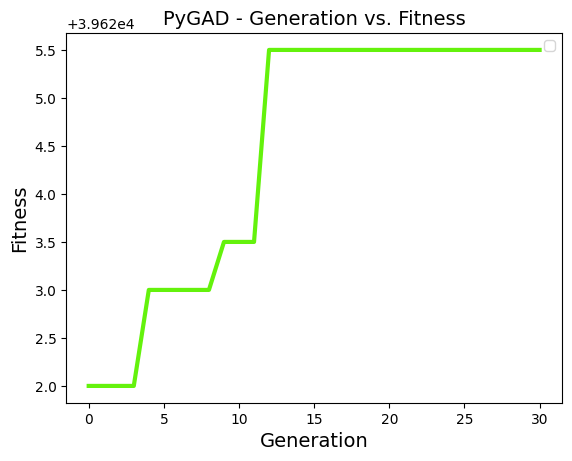

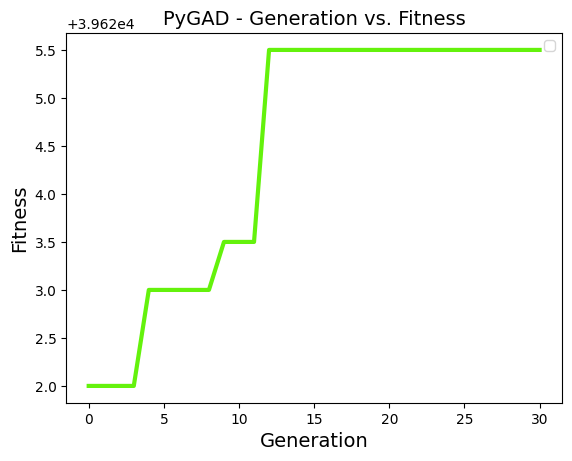

In [ ]:
ga_instance.plot_fitness()

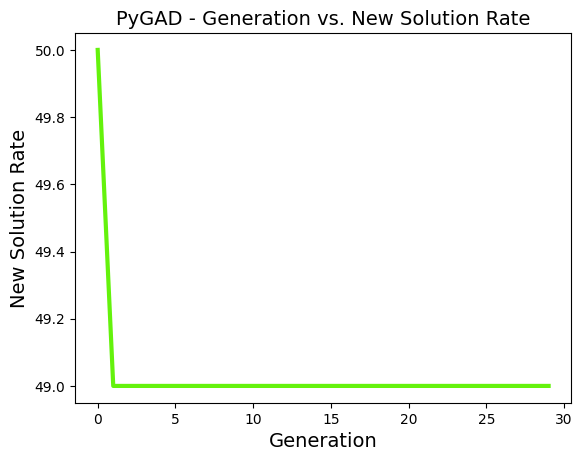

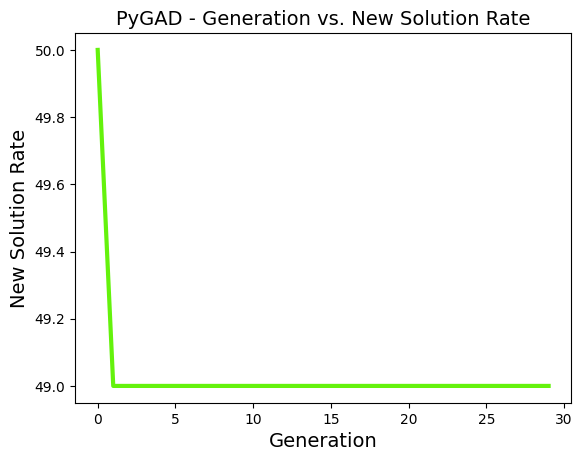

In [ ]:
ga_instance.plot_new_solution_rate()


this one does take a bit longer

In [ ]:
ga_instance.plot_genes()

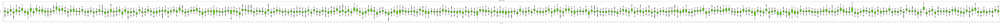

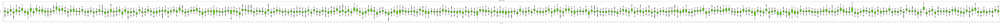

In [ ]:
ga_instance.plot_genes(
    graph_type="boxplot",
)

evaluation

build a base dataset of randomized games

In [ ]:
stratlist = [fiftyDove]
randomMatchups = dataSize(10000)


oppMoves = randomMatchups['oppNextMove']
testingData = randomMatchups.drop(columns=['randRounds', 'selfNextMove', 'oppNextMove', 'selfNextScore', 'oppNextScore', 'outputScore'])
testingData[:10]


,selfRoundone,selfRoundtwo,selfRoundthree,selfRoundfour,selfRoundfive,selfRoundsix,selfRoundseven,selfRoundeight,selfRoundnine,selfRoundten,...,oppRoundfive,oppRoundsix,oppRoundseven,oppRoundeight,oppRoundnine,oppRoundten,selfTotalScore,oppTotalScore,totalPoints,nextRoundPoints
0,2,1,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2.5,0.5,3,3
1,1,2,2,1,1,2,2,0,0,0,...,2,2,2,0,0,0,14.5,17.5,38,6
2,1,2,2,2,0,0,0,0,0,0,...,0,0,0,0,0,0,8.5,9.5,22,8
3,2,2,2,2,1,1,1,1,1,2,...,2,1,1,1,1,1,15.0,23.0,46,4
4,2,2,2,1,1,2,2,0,0,0,...,1,2,1,0,0,0,27.0,6.0,35,9
5,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,-0.5,-0.5,1,4
6,1,1,1,1,2,1,1,2,2,1,...,1,1,1,1,1,1,29.0,15.0,44,6
7,2,2,2,2,1,2,0,0,0,0,...,2,2,0,0,0,0,5.5,11.5,27,2
8,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0.0,5.0,5,1
9,2,1,1,2,0,0,0,0,0,0,...,0,0,0,0,0,0,5.5,11.5,19,2


based on the results of the genetic algorithm trainings, the results were expected and NN performance was solid. The algoritm consistently produced NNs that scored 4000-4250, and seemed to reach near optimization after only 20 generations or so. Based on performance of randomized patterns, the NNs produced also show promise for performance during games and matchups with significantly higher matchups. One part of this project that I found particularly interesting was seeing the presence of the actual genes being observed over the generations, and how some genes had obvious value to the NNs, while others quickly faded.


For future continuations on this project, there are multiple aspects that I would like to explore. I would like to icorporate more known training strategies into my training examples, and compare how a NN trained through genetic algorithms compared to one trained individually through traditinal unsupervised regression learning. Another concept that I may consider applying is different game theory games, however that may involve new projects from the ground up. Overall, though this project tested the strength of my own synapses, I very much so enjoyed being able to put my machine learning skills to the test a solve a much more complicated problem while also building my skills in python.